<a href="https://colab.research.google.com/github/adamstra/MyModel/blob/main/RT_DETR_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Entraîner RT-DETR sur notre ensemble de données

In [1]:
!nvidia-smi

Sun Dec  8 14:37:16 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


# Install dependencies

In [3]:
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q git+https://github.com/roboflow/supervision.git
!pip install -q accelerate
!pip install -q roboflow
!pip install -q torchmetrics
!pip install -q "albumentations>=1.4.5"

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 17.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 41.6 MB/s eta 0:00:00


# Imports

In [4]:
import torch
import requests

import numpy as np
import supervision as sv
import albumentations as A

from PIL import Image
from pprint import pprint
from roboflow import Roboflow
from dataclasses import dataclass, replace
from google.colab import userdata
from torch.utils.data import Dataset
from transformers import (
    AutoImageProcessor,
    AutoModelForObjectDetection,
    TrainingArguments,
    Trainer
)
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Inférence avec un modèle RT-DETR pré-entraîné

In [5]:
CHECKPOINT = "PekingU/rtdetr_r50vd_coco_o365"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = AutoModelForObjectDetection.from_pretrained(CHECKPOINT).to(DEVICE)
processor = AutoImageProcessor.from_pretrained(CHECKPOINT)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/5.11k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/172M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/841 [00:00<?, ?B/s]

In [6]:
URL = "https://media.roboflow.com/notebooks/examples/dog.jpeg"

image = Image.open(requests.get(URL, stream=True).raw)
inputs = processor(image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    outputs = model(**inputs)

w, h = image.size
results = processor.post_process_object_detection(
    outputs, target_sizes=[(h, w)], threshold=0.3)

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


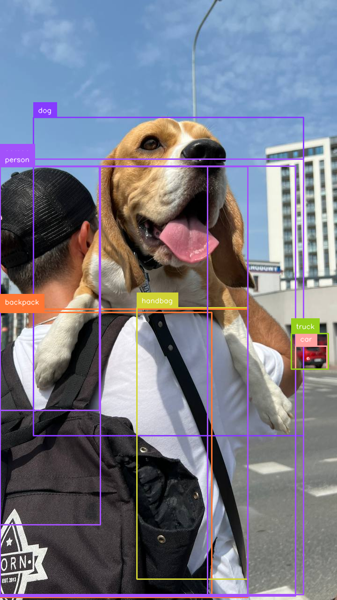

In [7]:
detections = sv.Detections.from_transformers(results[0])
labels = [
    model.config.id2label[class_id]
    for class_id
    in detections.class_id
]

annotated_image = image.copy()
annotated_image = sv.BoundingBoxAnnotator().annotate(annotated_image, detections)
annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels=labels)
annotated_image.thumbnail((600, 600))
annotated_image

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


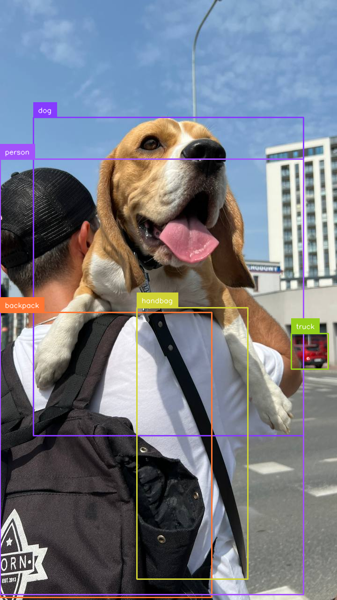

In [8]:
detections = sv.Detections.from_transformers(results[0]).with_nms(threshold=0.1)
labels = [
    model.config.id2label[class_id]
    for class_id
    in detections.class_id
]

annotated_image = image.copy()
annotated_image = sv.BoundingBoxAnnotator().annotate(annotated_image, detections)
annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels=labels)
annotated_image.thumbnail((600, 600))
annotated_image

# Fine-tune RT-DETR sur notre ensemble de données

In [9]:
from roboflow import Roboflow
rf = Roboflow(api_key="kMue3Ik6JEMwYQ1MqptK")
project = rf.workspace("adams-tra-xbfl0").project("road-traffic-nhks7")
version = project.version(2)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Road-traffic-2 in coco:: 100%|██████████| 1062/1062 [00:00<00:00, 3130.93it/s]


In [10]:
ds_train = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/train",
    annotations_path=f"{dataset.location}/train/_annotations.coco.json",
)
ds_valid = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/valid",
    annotations_path=f"{dataset.location}/valid/_annotations.coco.json",
)
ds_test = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

print(f"Number of training images: {len(ds_train)}")
print(f"Number of validation images: {len(ds_valid)}")
print(f"Number of test images: {len(ds_test)}")

Number of training images: 739
Number of validation images: 210
Number of test images: 105


BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBox

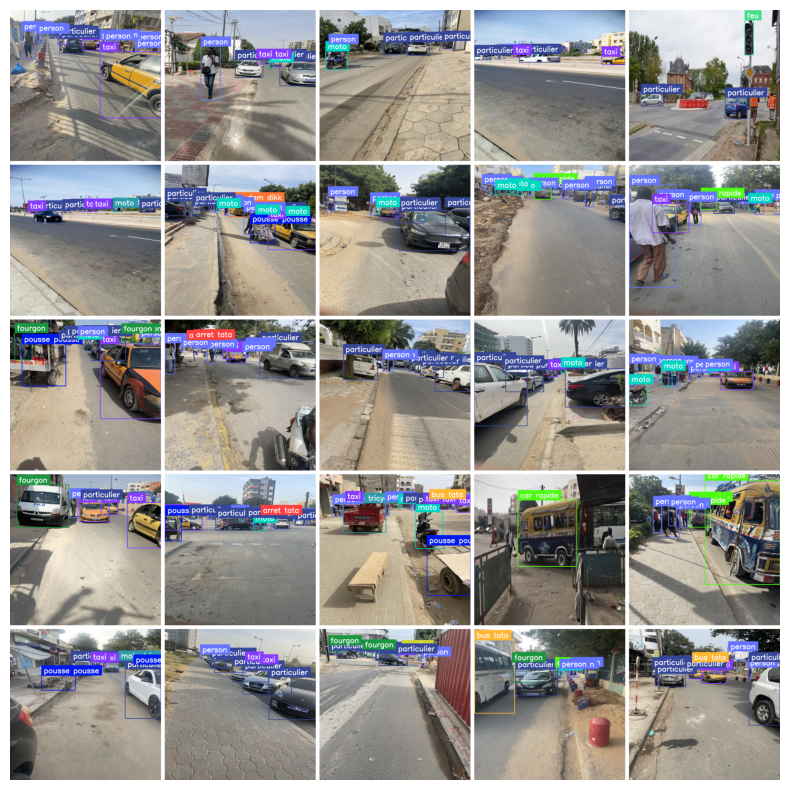

In [11]:
# @title Display dataset sample

GRID_SIZE = 5

def annotate(image, annotations, classes):
    labels = [
        classes[class_id]
        for class_id
        in annotations.class_id
    ]

    bounding_box_annotator = sv.BoundingBoxAnnotator()
    label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=2)

    annotated_image = image.copy()
    annotated_image = bounding_box_annotator.annotate(annotated_image, annotations)
    annotated_image = label_annotator.annotate(annotated_image, annotations, labels=labels)
    return annotated_image

annotated_images = []
for i in range(GRID_SIZE * GRID_SIZE):
    _, image, annotations = ds_train[i]
    annotated_image = annotate(image, annotations, ds_train.classes)
    annotated_images.append(annotated_image)

grid = sv.create_tiles(
    annotated_images,
    grid_size=(GRID_SIZE, GRID_SIZE),
    single_tile_size=(400, 400),
    tile_padding_color=sv.Color.WHITE,
    tile_margin_color=sv.Color.WHITE
)
sv.plot_image(grid, size=(10, 10))

# Preprocess the data

Pour fine-tune un modèle, vous devez prétraiter les données que vous prévoyez d'utiliser pour qu'elles correspondent précisément à l'approche utilisée pour le modèle pré-entraîné. AutoImageProcessor s'occupe du traitement des données d'image pour créer des valeurs `pixel_value`, `pixel_mask` et des `étiquettes` avec lesquelles un modèle DETR peut s'entraîner. Le processeur d'image possède certains attributs dont vous n'aurez pas à vous soucier:



In [12]:

IMAGE_SIZE = 480

processor = AutoImageProcessor.from_pretrained(
    CHECKPOINT,
    do_resize=True,
    size={"width": IMAGE_SIZE, "height": IMAGE_SIZE},
)

In [13]:
train_augmentation_and_transform = A.Compose(
    [
        A.Perspective(p=0.1),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(p=0.1),
    ],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=25
    ),
)

valid_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=1
    ),
)

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


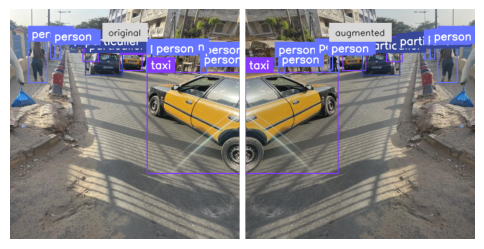

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


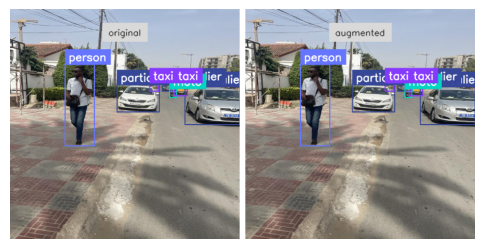

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


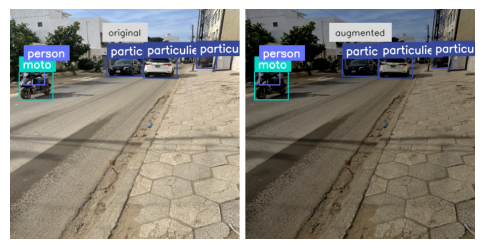

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


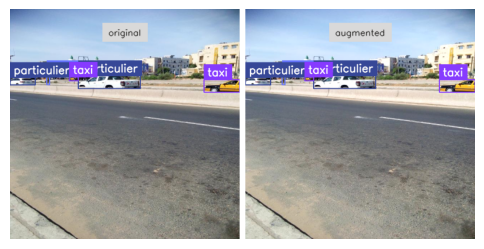

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


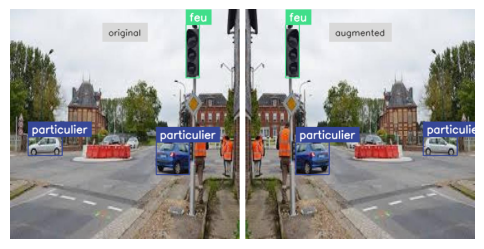

In [14]:
# @title Visualize some augmented images

IMAGE_COUNT = 5

for i in range(IMAGE_COUNT):
    _, image, annotations = ds_train[i]

    output = train_augmentation_and_transform(
        image=image,
        bboxes=annotations.xyxy,
        category=annotations.class_id
    )

    augmented_image = output["image"]
    augmented_annotations = replace(
        annotations,
        xyxy=np.array(output["bboxes"]),
        class_id=np.array(output["category"])
    )

    annotated_images = [
        annotate(image, annotations, ds_train.classes),
        annotate(augmented_image, augmented_annotations, ds_train.classes)
    ]
    grid = sv.create_tiles(
        annotated_images,
        titles=['original', 'augmented'],
        titles_scale=0.5,
        single_tile_size=(400, 400),
        tile_padding_color=sv.Color.WHITE,
        tile_margin_color=sv.Color.WHITE
    )
    sv.plot_image(grid, size=(6, 6))

In [15]:
class PyTorchDetectionDataset(Dataset):
    def __init__(self, dataset: sv.DetectionDataset, processor, transform: A.Compose = None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    @staticmethod
    def annotations_as_coco(image_id, categories, boxes):
        annotations = []
        for category, bbox in zip(categories, boxes):
            x1, y1, x2, y2 = bbox
            formatted_annotation = {
                "image_id": image_id,
                "category_id": category,
                "bbox": [x1, y1, x2 - x1, y2 - y1],
                "iscrowd": 0,
                "area": (x2 - x1) * (y2 - y1),
            }
            annotations.append(formatted_annotation)

        return {
            "image_id": image_id,
            "annotations": annotations,
        }

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        _, image, annotations = self.dataset[idx]

        # Convert image to RGB numpy array
        image = image[:, :, ::-1]
        boxes = annotations.xyxy
        categories = annotations.class_id

        if self.transform:
            transformed = self.transform(
                image=image,
                bboxes=boxes,
                category=categories
            )
            image = transformed["image"]
            boxes = transformed["bboxes"]
            categories = transformed["category"]


        formatted_annotations = self.annotations_as_coco(
            image_id=idx, categories=categories, boxes=boxes)
        result = self.processor(
            images=image, annotations=formatted_annotations, return_tensors="pt")

        # Image processor expands batch dimension, lets squeeze it
        result = {k: v[0] for k, v in result.items()}

        return result

In [16]:
pytorch_dataset_train = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)
pytorch_dataset_valid = PyTorchDetectionDataset(
    ds_valid, processor, transform=valid_transform)
pytorch_dataset_test = PyTorchDetectionDataset(
    ds_test, processor, transform=valid_transform)

pytorch_dataset_train[15]

{'pixel_values': tensor([[[0.3333, 0.3176, 0.2784,  ..., 0.5608, 0.5608, 0.5569],
          [0.3725, 0.3608, 0.3333,  ..., 0.5686, 0.5647, 0.5608],
          [0.3804, 0.3765, 0.3686,  ..., 0.5765, 0.5725, 0.5686],
          ...,
          [0.4118, 0.4235, 0.4431,  ..., 0.7020, 0.7490, 0.7412],
          [0.4275, 0.4431, 0.4392,  ..., 0.7333, 0.7647, 0.7725],
          [0.4275, 0.4510, 0.4275,  ..., 0.7529, 0.7569, 0.7608]],
 
         [[0.2980, 0.2824, 0.2431,  ..., 0.6157, 0.6157, 0.6118],
          [0.3373, 0.3255, 0.2980,  ..., 0.6235, 0.6196, 0.6157],
          [0.3451, 0.3451, 0.3333,  ..., 0.6314, 0.6275, 0.6235],
          ...,
          [0.3961, 0.4078, 0.4235,  ..., 0.6667, 0.7137, 0.7059],
          [0.4078, 0.4196, 0.4196,  ..., 0.6980, 0.7294, 0.7373],
          [0.4000, 0.4275, 0.4078,  ..., 0.7176, 0.7216, 0.7255]],
 
         [[0.2627, 0.2471, 0.2078,  ..., 0.7176, 0.7176, 0.7137],
          [0.3020, 0.2902, 0.2627,  ..., 0.7255, 0.7216, 0.7176],
          [0.3098, 0.309

In [17]:
def collate_fn(batch):
    data = {}
    data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
    data["labels"] = [x["labels"] for x in batch]
    return data

# Preparing function to compute mAP

In [18]:
id2label = {id: label for id, label in enumerate(ds_train.classes)}
label2id = {label: id for id, label in enumerate(ds_train.classes)}


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


class MAPEvaluator:

    def __init__(self, image_processor, threshold=0.00, id2label=None):
        self.image_processor = image_processor
        self.threshold = threshold
        self.id2label = id2label

    def collect_image_sizes(self, targets):
        """Collect image sizes across the dataset as list of tensors with shape [batch_size, 2]."""
        image_sizes = []
        for batch in targets:
            batch_image_sizes = torch.tensor(np.array([x["size"] for x in batch]))
            image_sizes.append(batch_image_sizes)
        return image_sizes

    def collect_targets(self, targets, image_sizes):
        post_processed_targets = []
        for target_batch, image_size_batch in zip(targets, image_sizes):
            for target, (height, width) in zip(target_batch, image_size_batch):
                boxes = target["boxes"]
                boxes = sv.xcycwh_to_xyxy(boxes)
                boxes = boxes * np.array([width, height, width, height])
                boxes = torch.tensor(boxes)
                labels = torch.tensor(target["class_labels"])
                post_processed_targets.append({"boxes": boxes, "labels": labels})
        return post_processed_targets

    def collect_predictions(self, predictions, image_sizes):
        post_processed_predictions = []
        for batch, target_sizes in zip(predictions, image_sizes):
            batch_logits, batch_boxes = batch[1], batch[2]
            output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
            post_processed_output = self.image_processor.post_process_object_detection(
                output, threshold=self.threshold, target_sizes=target_sizes
            )
            post_processed_predictions.extend(post_processed_output)
        return post_processed_predictions

    @torch.no_grad()
    def __call__(self, evaluation_results):

        predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

        image_sizes = self.collect_image_sizes(targets)
        post_processed_targets = self.collect_targets(targets, image_sizes)
        post_processed_predictions = self.collect_predictions(predictions, image_sizes)

        evaluator = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
        evaluator.warn_on_many_detections = False
        evaluator.update(post_processed_predictions, post_processed_targets)

        metrics = evaluator.compute()

        # Replace list of per class metrics with separate metric for each class
        classes = metrics.pop("classes")
        map_per_class = metrics.pop("map_per_class")
        mar_100_per_class = metrics.pop("mar_100_per_class")
        for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
            class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
            metrics[f"map_{class_name}"] = class_map
            metrics[f"mar_100_{class_name}"] = class_mar

        metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

        return metrics

eval_compute_metrics_fn = MAPEvaluator(image_processor=processor, threshold=0.01, id2label=id2label)

# Training the detection model

In [19]:
model = AutoModelForObjectDetection.from_pretrained(
    CHECKPOINT,
    id2label=id2label,
    label2id=label2id,
    anchor_image_size=None,
    ignore_mismatched_sizes=True,
)

Some weights of RTDetrForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_r50vd_coco_o365 and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([17]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([17, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([17]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([17, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([17]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([17, 256]) in the model instantiated
- 

In [20]:
training_args = TrainingArguments(
    output_dir=f"{dataset.name.replace(' ', '-')}-finetune",
    num_train_epochs=20,
    max_grad_norm=0.1,
    learning_rate=5e-5,
    warmup_steps=300,
    per_device_train_batch_size=16,
    dataloader_num_workers=2,
    metric_for_best_model="eval_map",
    greater_is_better=True,
    load_best_model_at_end=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    remove_unused_columns=False,
    eval_do_concat_batches=False,
)

In [21]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=pytorch_dataset_train,
    eval_dataset=pytorch_dataset_valid,
    tokenizer=processor,
    data_collator=collate_fn,
    compute_metrics=eval_compute_metrics_fn,
)

trainer.train()

`tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Voiture-moto-camion-charette-ect,Mar 100 Voiture-moto-camion-charette-ect,Map Arret tata,Mar 100 Arret tata,Map Bus,Mar 100 Bus,Map Bus dem dikk,Mar 100 Bus dem dikk,Map Bus tata,Mar 100 Bus tata,Map Camion,Mar 100 Camion,Map Car rapide,Mar 100 Car rapide,Map Charette,Mar 100 Charette,Map Feu,Mar 100 Feu,Map Fourgon,Mar 100 Fourgon,Map Moto,Mar 100 Moto,Map Moto tricycle,Mar 100 Moto tricycle,Map Ndiaga ndiaye,Mar 100 Ndiaga ndiaye,Map Particulier,Mar 100 Particulier,Map Person,Mar 100 Person,Map Pousse pousse,Mar 100 Pousse pousse,Map Taxi,Mar 100 Taxi
1,No log,19.864534,0.001900,0.002500,0.001900,0.000600,0.002600,0.013300,0.011600,0.028800,0.034700,0.005300,0.034800,0.080000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000800,0.066700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000100,0.018200,0.000000,0.010600,0.001100,0.033300,0.001600,0.076900,0.001700,0.121200,0.002900,0.016600,0.000100,0.018500,0.021800,0.193000
2,No log,13.385917,0.016800,0.024200,0.017200,0.006100,0.025900,0.043500,0.024300,0.072000,0.091800,0.049700,0.110100,0.182400,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.027300,0.000000,0.025000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000400,0.088500,0.001200,0.079200,0.013200,0.038500,0.067600,0.529900,0.037400,0.124900,0.000300,0.077800,0.148700,0.478600
3,No log,11.175562,0.042900,0.063000,0.045800,0.019300,0.066900,0.110100,0.080100,0.215900,0.251800,0.081700,0.291700,0.495000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.008400,0.450000,0.039000,0.271200,0.019500,0.345500,0.000300,0.364300,0.000000,0.000000,0.000000,0.000000,0.015700,0.301800,0.051400,0.170600,0.008400,0.283300,0.006400,0.238500,0.179100,0.670100,0.096400,0.309000,0.000300,0.048100,0.261100,0.576900
4,No log,10.006845,0.105600,0.147400,0.110600,0.042300,0.137300,0.257800,0.183200,0.340100,0.375800,0.162600,0.424400,0.646700,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.023000,0.666700,0.180600,0.460600,0.102100,0.475800,0.004300,0.607100,0.000800,0.077800,0.000000,0.000000,0.167300,0.452700,0.128800,0.315100,0.008200,0.379200,0.070500,0.503800,0.328500,0.683100,0.153100,0.367800,0.049000,0.359300,0.474200,0.664500
5,No log,9.650543,0.134800,0.187900,0.143900,0.048000,0.183200,0.285900,0.218800,0.377500,0.400600,0.141100,0.447000,0.723900,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.049500,0.550000,0.213300,0.442400,0.210400,0.487900,0.015100,0.610700,0.013500,0.405600,0.000000,0.000000,0.147100,0.503600,0.116000,0.296800,0.010600,0.450000,0.175500,0.569200,0.453700,0.631000,0.173700,0.408800,0.137400,0.377800,0.441100,0.675900
6,No log,8.982121,0.164700,0.233900,0.173500,0.063200,0.233000,0.331000,0.246900,0.407400,0.464200,0.166600,0.510100,0.768000,-1.000000,-1.000000,0.000000,0.000000,0.000300,0.450000,0.054400,0.608300,0.230800,0.481800,0.158100,0.500000,0.040600,0.717900,0.048700,0.438900,0.000000,0.000000,0.230500,0.558200,0.169000,0.365600,0.020900,0.491700,0.211100,0.673100,0.512100,0.667300,0.217500,0.419300,0.209400,0.374100,0.531600,0.680600
7,No log,8.567788,0.206100,0.294500,0.218500,0.078500,0.268500,0.384900,0.292600,0.478100,0.511800,0.228200,0.573500,0.793300,-1.000000,-1.000000,0.000000,0.000000,0.002200,0.750000,0.067100,0.658300,0.281900,0.610600,0.247900,0.506100,0.175400,0.732100,0.262900,0.461100,0.000100,0.100000,0.197600,0.609100,0.189400,0.365100,0.027300,0.487500,0.302600,0.688500,0.543700,0.684800,0.230200,0.425100,0.204300,0.411100,0.564500,0.698700
8,No log,8.480337,0.233000,0.319700,0.248300,0.079200,0.291200,0.438300,0.310200,0.500600,0.544700,0.237000,0.603800,0.849700,-1.000000,-1.000000,0.000000,0.000000,0.002000,0.800000,0.085800,0.558300,0.275600,0.568200,0.249000,0.509100,0.377600,0.696400,0.2

Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Voiture-moto-camion-charette-ect,Mar 100 Voiture-moto-camion-charette-ect,Map Arret tata,Mar 100 Arret tata,Map Bus,Mar 100 Bus,Map Bus dem dikk,Mar 100 Bus dem dikk,Map Bus tata,Mar 100 Bus tata,Map Camion,Mar 100 Camion,Map Car rapide,Mar 100 Car rapide,Map Charette,Mar 100 Charette,Map Feu,Mar 100 Feu,Map Fourgon,Mar 100 Fourgon,Map Moto,Mar 100 Moto,Map Moto tricycle,Mar 100 Moto tricycle,Map Ndiaga ndiaye,Mar 100 Ndiaga ndiaye,Map Particulier,Mar 100 Particulier,Map Person,Mar 100 Person,Map Pousse pousse,Mar 100 Pousse pousse,Map Taxi,Mar 100 Taxi
1,No log,19.864534,0.001900,0.002500,0.001900,0.000600,0.002600,0.013300,0.011600,0.028800,0.034700,0.005300,0.034800,0.080000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000800,0.066700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000100,0.018200,0.000000,0.010600,0.001100,0.033300,0.001600,0.076900,0.001700,0.121200,0.002900,0.016600,0.000100,0.018500,0.021800,0.193000
2,No log,13.385917,0.016800,0.024200,0.017200,0.006100,0.025900,0.043500,0.024300,0.072000,0.091800,0.049700,0.110100,0.182400,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.027300,0.000000,0.025000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000400,0.088500,0.001200,0.079200,0.013200,0.038500,0.067600,0.529900,0.037400,0.124900,0.000300,0.077800,0.148700,0.478600
3,No log,11.175562,0.042900,0.063000,0.045800,0.019300,0.066900,0.110100,0.080100,0.215900,0.251800,0.081700,0.291700,0.495000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.008400,0.450000,0.039000,0.271200,0.019500,0.345500,0.000300,0.364300,0.000000,0.000000,0.000000,0.000000,0.015700,0.301800,0.051400,0.170600,0.008400,0.283300,0.006400,0.238500,0.179100,0.670100,0.096400,0.309000,0.000300,0.048100,0.261100,0.576900
4,No log,10.006845,0.105600,0.147400,0.110600,0.042300,0.137300,0.257800,0.183200,0.340100,0.375800,0.162600,0.424400,0.646700,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.023000,0.666700,0.180600,0.460600,0.102100,0.475800,0.004300,0.607100,0.000800,0.077800,0.000000,0.000000,0.167300,0.452700,0.128800,0.315100,0.008200,0.379200,0.070500,0.503800,0.328500,0.683100,0.153100,0.367800,0.049000,0.359300,0.474200,0.664500
5,No log,9.650543,0.134800,0.187900,0.143900,0.048000,0.183200,0.285900,0.218800,0.377500,0.400600,0.141100,0.447000,0.723900,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.049500,0.550000,0.213300,0.442400,0.210400,0.487900,0.015100,0.610700,0.013500,0.405600,0.000000,0.000000,0.147100,0.503600,0.116000,0.296800,0.010600,0.450000,0.175500,0.569200,0.453700,0.631000,0.173700,0.408800,0.137400,0.377800,0.441100,0.675900
6,No log,8.982121,0.164700,0.233900,0.173500,0.063200,0.233000,0.331000,0.246900,0.407400,0.464200,0.166600,0.510100,0.768000,-1.000000,-1.000000,0.000000,0.000000,0.000300,0.450000,0.054400,0.608300,0.230800,0.481800,0.158100,0.500000,0.040600,0.717900,0.048700,0.438900,0.000000,0.000000,0.230500,0.558200,0.169000,0.365600,0.020900,0.491700,0.211100,0.673100,0.512100,0.667300,0.217500,0.419300,0.209400,0.374100,0.531600,0.680600
7,No log,8.567788,0.206100,0.294500,0.218500,0.078500,0.268500,0.384900,0.292600,0.478100,0.511800,0.228200,0.573500,0.793300,-1.000000,-1.000000,0.000000,0.000000,0.002200,0.750000,0.067100,0.658300,0.281900,0.610600,0.247900,0.506100,0.175400,0.732100,0.262900,0.461100,0.000100,0.100000,0.197600,0.609100,0.189400,0.365100,0.027300,0.487500,0.302600,0.688500,0.543700,0.684800,0.230200,0.425100,0.204300,0.411100,0.564500,0.698700
8,No log,8.480337,0.233000,0.319700,0.248300,0.079200,0.291200,0.438300,0.310200,0.500600,0.544700,0.237000,0.603800,0.849700,-1.000000,-1.000000,0.000000,0.000000,0.002000,0.800000,0.085800,0.558300,0.275600,0.568200,0.249000,0.509100,0.377600,0.696400,0.2

There were missing keys in the checkpoint model loaded: ['class_embed.0.weight', 'class_embed.0.bias', 'class_embed.1.weight', 'class_embed.1.bias', 'class_embed.2.weight', 'class_embed.2.bias', 'class_embed.3.weight', 'class_embed.3.bias', 'class_embed.4.weight', 'class_embed.4.bias', 'class_embed.5.weight', 'class_embed.5.bias', 'bbox_embed.0.layers.0.weight', 'bbox_embed.0.layers.0.bias', 'bbox_embed.0.layers.1.weight', 'bbox_embed.0.layers.1.bias', 'bbox_embed.0.layers.2.weight', 'bbox_embed.0.layers.2.bias', 'bbox_embed.1.layers.0.weight', 'bbox_embed.1.layers.0.bias', 'bbox_embed.1.layers.1.weight', 'bbox_embed.1.layers.1.bias', 'bbox_embed.1.layers.2.weight', 'bbox_embed.1.layers.2.bias', 'bbox_embed.2.layers.0.weight', 'bbox_embed.2.layers.0.bias', 'bbox_embed.2.layers.1.weight', 'bbox_embed.2.layers.1.bias', 'bbox_embed.2.layers.2.weight', 'bbox_embed.2.layers.2.bias', 'bbox_embed.3.layers.0.weight', 'bbox_embed.3.layers.0.bias', 'bbox_embed.3.layers.1.weight', 'bbox_embed.3.l

TrainOutput(global_step=940, training_loss=14.486298516456117, metrics={'train_runtime': 2229.7148, 'train_samples_per_second': 6.629, 'train_steps_per_second': 0.422, 'total_flos': 2.620834980701184e+18, 'train_loss': 14.486298516456117, 'epoch': 20.0})

# Evaluate

In [22]:
# @title Collect predictions

targets = []
predictions = []

for i in range(len(ds_test)):
    path, sourece_image, annotations = ds_test[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0])

    targets.append(annotations)
    predictions.append(detections)


In [23]:
# @title Calculate mAP
mean_average_precision = sv.MeanAveragePrecision.from_detections(
    predictions=predictions,
    targets=targets,
)

print(f"map50_95: {mean_average_precision.map50_95:.2f}")
print(f"map50: {mean_average_precision.map50:.2f}")
print(f"map75: {mean_average_precision.map75:.2f}")

map50_95: 0.38
map50: 0.48
map75: 0.40


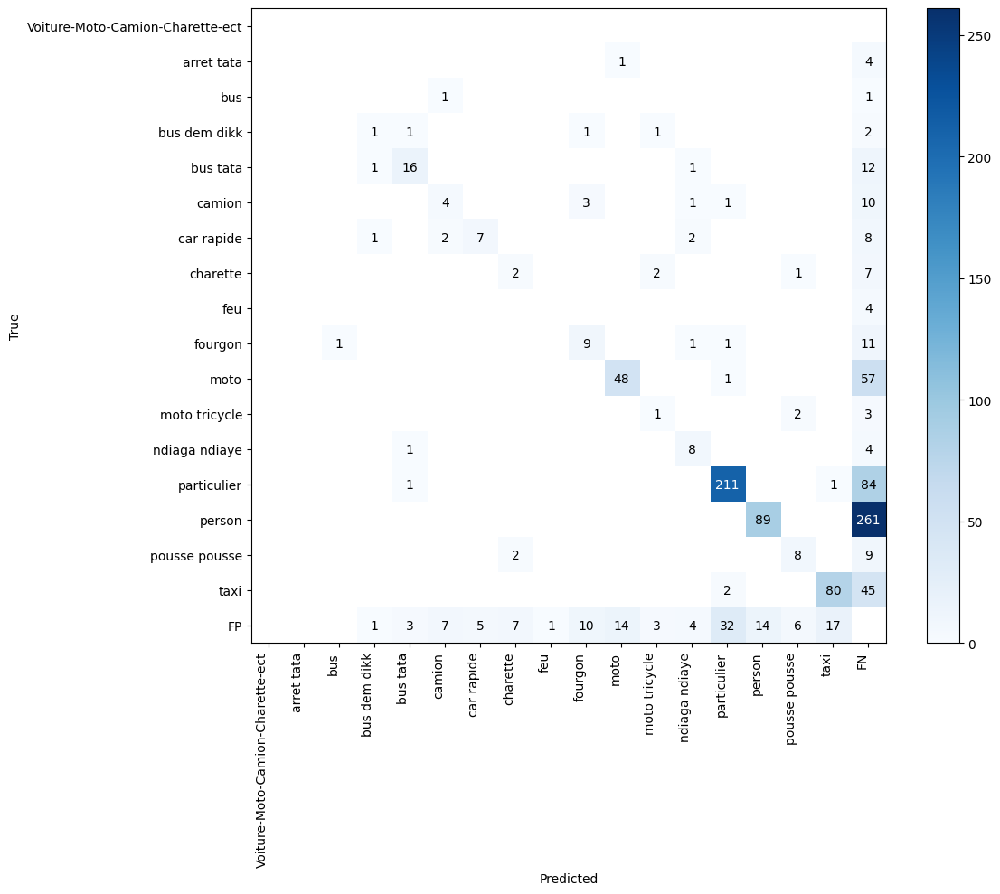

In [24]:
# @title Calculate Confusion Matrix
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds_test.classes
)

_ = confusion_matrix.plot()

# Save fine-tuned model on hard drive

In [25]:
model.save_pretrained("/content/rt-detr/")
processor.save_pretrained("/content/rt-detr/")

['/content/rt-detr/preprocessor_config.json']

# Inference with fine-tuned RT-DETR model

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


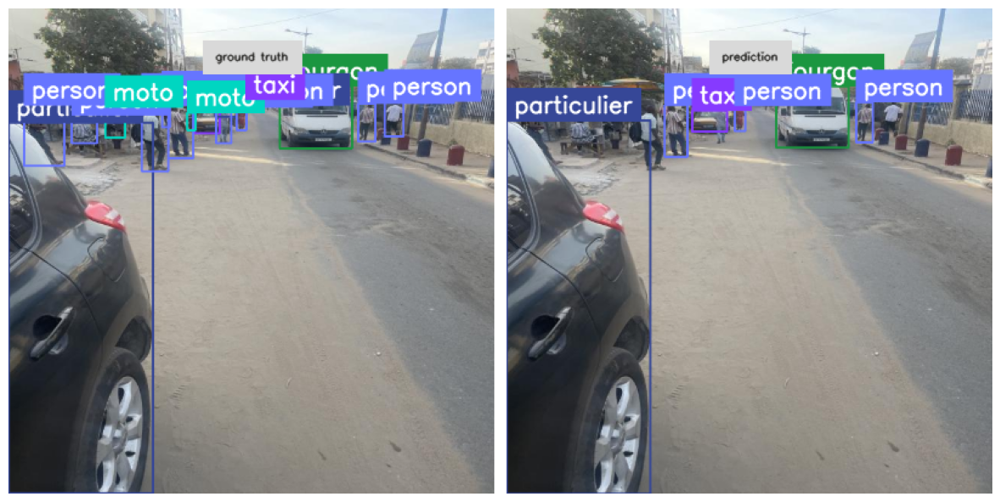

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


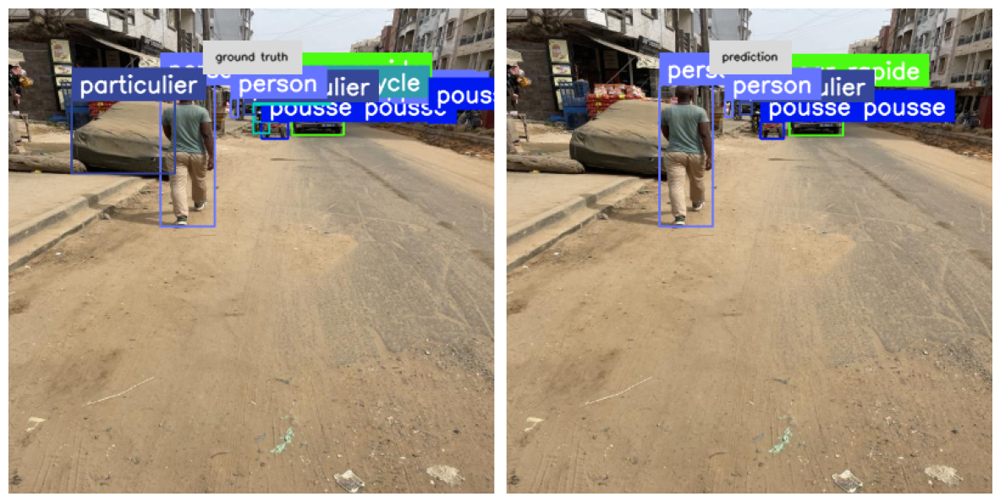

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


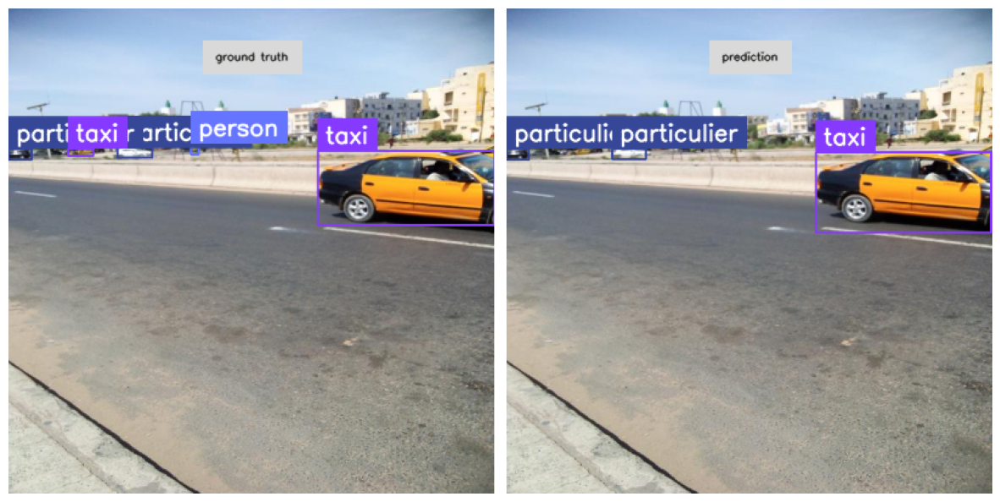

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


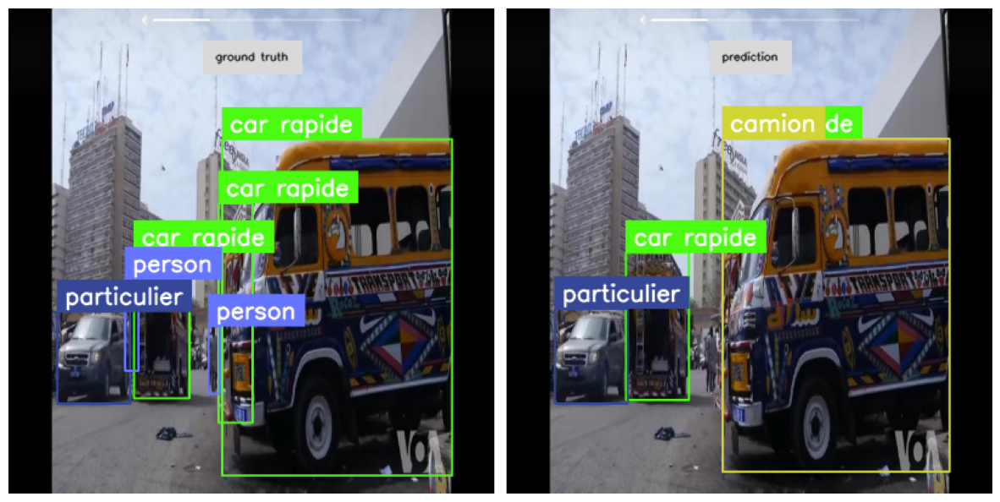

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


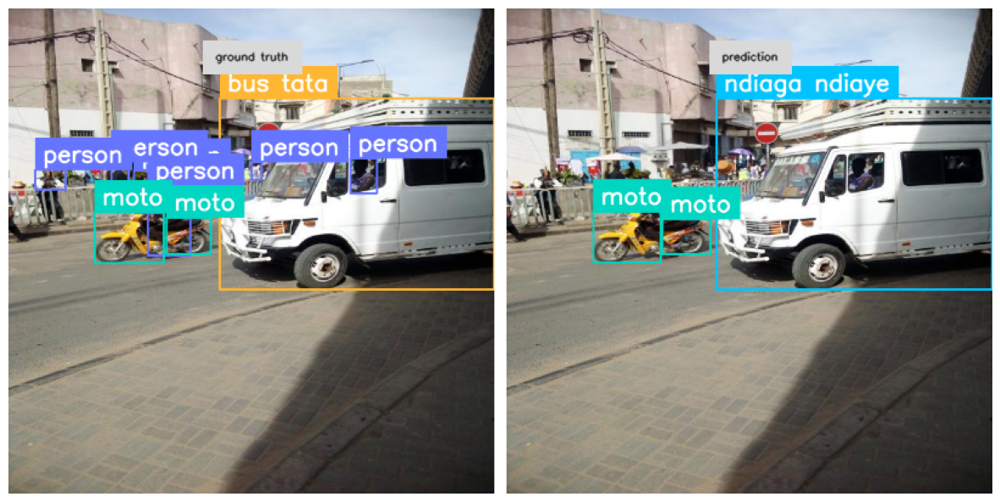

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


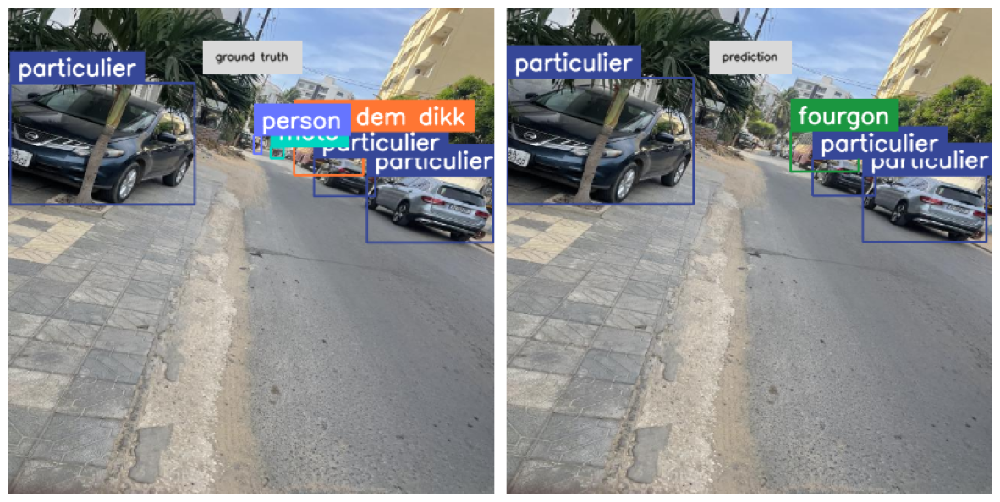

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


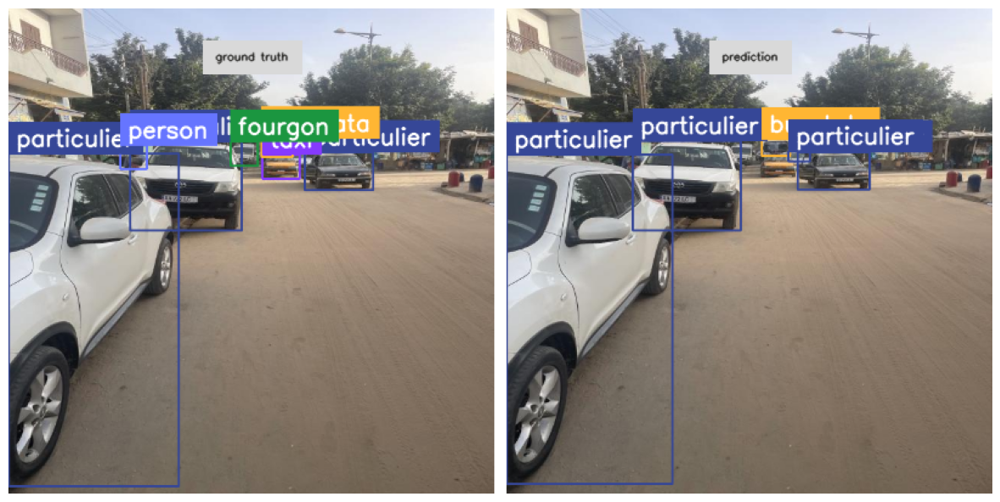

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


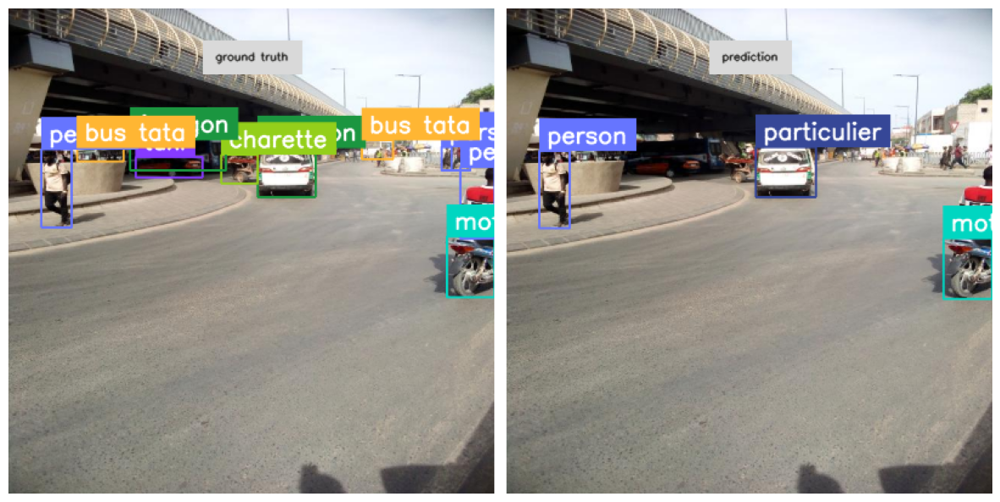

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


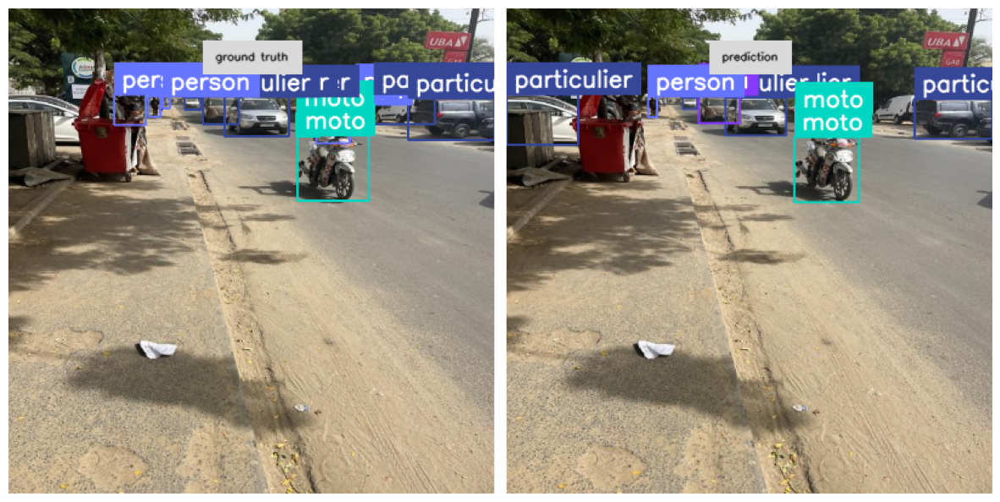

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


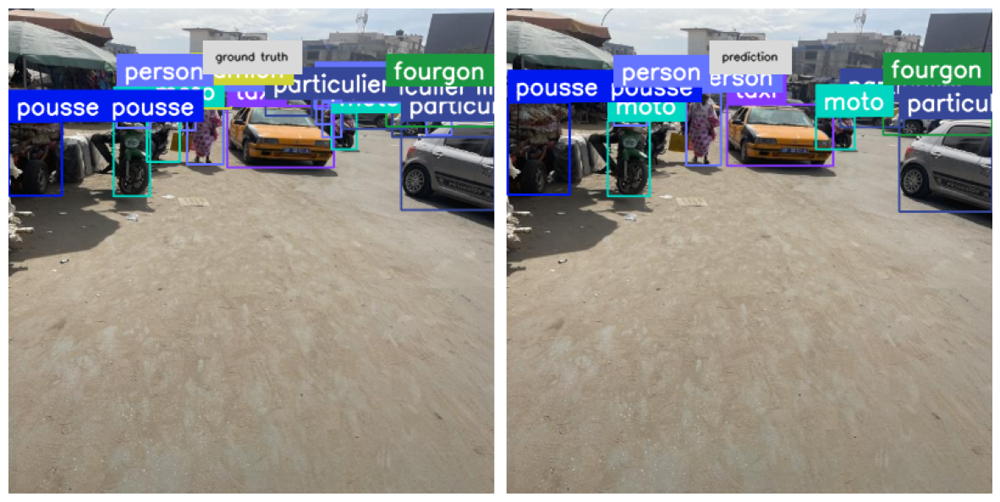

In [29]:

IMAGE_COUNT = 10

for i in range(IMAGE_COUNT):
    path, sourece_image, annotations = ds_test[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0]).with_nms(threshold=0.1)

    annotated_images = [
        annotate(sourece_image, annotations, ds_train.classes),
        annotate(sourece_image, detections, ds_train.classes)
    ]
    grid = sv.create_tiles(
        annotated_images,
        titles=['ground truth', 'prediction'],
        titles_scale=0.3,
        single_tile_size=(400, 400),
        tile_padding_color=sv.Color.WHITE,
        tile_margin_color=sv.Color.WHITE
    )
    sv.plot_image(grid, size=(15, 15))